In [130]:
import warnings
warnings.filterwarnings("ignore")

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('ggplot')
import seaborn as sns

## matplotlib 그래프에서 한글 깨짐 해결
import matplotlib
from matplotlib import font_manager, rc
import platform

if platform.system() == 'Windows':
# 윈도우인 경우
    font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
else:    
# Mac 인 경우
    rc('font', family='AppleGothic')
    
matplotlib.rcParams['axes.unicode_minus'] = False 

In [2]:
## 제공 데이터 불러오기
df = pd.read_excel('/Users/andrew/hongsu/data/01_제공데이터/2021 빅콘테스트_데이터분석분야_퓨처스리그_홍수ZERO_댐유입량,강우,수위데이터_210803.xlsx', header=[0,1])[:2891]  # 이후부터는 유입량이 없는 데이터
df.columns = ['_'.join(col).strip() if "Unnamed" not in col[1] else col[0] for col in df.columns.values]

In [12]:
## 제공 데이터 사이즈
df.shape

(2891, 48)

In [14]:
display(df.head())
display(df.tail())

,홍수사상번호,연,월,일,시간,유입량,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
0,1,2006,7,10,8,189.100000,6.4,7,7,7,...,8,2.54,122.660,6.4,7,7,8,8,2.54,122.610
1,1,2006,7,10,9,216.951962,6.3,7,8,7,...,10,2.53,122.648,7.3,7,8,10,10,2.53,122.600
2,1,2006,7,10,10,251.424419,6.4,7,9,7,...,11,2.53,122.636,8.2,7,9,10,11,2.53,122.590
3,1,2006,7,10,11,302.812199,7.3,7,10,7,...,14,2.53,122.620,11.3,9,10,15,14,2.53,122.585
4,1,2006,7,10,12,384.783406,8.2,7,12,8,...,16,2.53,122.604,14.4,12,12,18,16,2.53,122.575


,홍수사상번호,연,월,일,시간,유입량,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
2886,25,2017,7,18,18,513.368437,22.7836,6,0,1,...,1,3.03,137.088,1.7366,6,0,1,1,3.03,137.130
2887,25,2017,7,18,19,502.846843,8.2586,2,0,1,...,1,3.00,137.104,1.7366,2,0,1,1,3.00,137.145
2888,25,2017,7,18,20,491.954805,4.1089,1,0,1,...,1,2.98,137.120,1.7366,1,0,1,1,2.98,137.155
2889,25,2017,7,18,21,481.103083,3.3854,1,0,1,...,1,2.96,137.136,1.7366,1,0,1,1,2.96,137.165
2890,25,2017,7,18,22,470.458109,3.2841,1,0,1,...,1,2.94,137.152,1.7366,1,0,1,1,2.94,137.180


<br>
<br>

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2891 entries, 0 to 2890
Data columns (total 48 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   홍수사상번호            2891 non-null   int64  
 1   연                 2891 non-null   int64  
 2   월                 2891 non-null   int64  
 3   일                 2891 non-null   int64  
 4   시간                2891 non-null   int64  
 5   유입량               2891 non-null   float64
 6   데이터집단 1_유역평균강수    2891 non-null   float64
 7   데이터집단 1_강우(A지역)   2891 non-null   int64  
 8   데이터집단 1_강우(B지역)   2891 non-null   int64  
 9   데이터집단 1_강우(C지역)   2891 non-null   int64  
 10  데이터집단 1_강우(D지역)   2891 non-null   int64  
 11  데이터집단 1_수위(E지역)   2891 non-null   float64
 12  데이터집단 1_수위(D지역)   2891 non-null   float64
 13  데이터집단 2_유역평균강수    2891 non-null   float64
 14  데이터집단 2_강우(A지역)   2891 non-null   int64  
 15  데이터집단 2_강우(B지역)   2891 non-null   int64  
 16  데이터집단 2_강우(C지역)   2891 non-null   int64  


In [16]:
## 결측치 확인 (결측치 없음)
df.isnull().sum() / len(df) * 100

홍수사상번호              0.0
연                   0.0
월                   0.0
일                   0.0
시간                  0.0
유입량                 0.0
데이터집단 1_유역평균강수      0.0
데이터집단 1_강우(A지역)     0.0
데이터집단 1_강우(B지역)     0.0
데이터집단 1_강우(C지역)     0.0
데이터집단 1_강우(D지역)     0.0
데이터집단 1_수위(E지역)     0.0
데이터집단 1_수위(D지역)     0.0
데이터집단 2_유역평균강수      0.0
데이터집단 2_강우(A지역)     0.0
데이터집단 2_강우(B지역)     0.0
데이터집단 2_강우(C지역)     0.0
데이터집단 2_강우(D지역)     0.0
데이터집단 2_수위(E지역)     0.0
데이터집단 2_수위(D지역)     0.0
데이터집단 3_유역평균강수      0.0
데이터집단 3_강우(A지역)     0.0
데이터집단 3_강우(B지역)     0.0
데이터집단 3_강우(C지역)     0.0
데이터집단 3_강우(D지역)     0.0
데이터집단 3_수위(E지역)     0.0
데이터집단 3_수위(D지역)     0.0
데이터 집단 4_유역평균강수     0.0
데이터 집단 4_강우(A지역)    0.0
데이터 집단 4_강우(B지역)    0.0
데이터 집단 4_강우(C지역)    0.0
데이터 집단 4_강우(D지역)    0.0
데이터 집단 4_수위(E지역)    0.0
데이터 집단 4_수위(D지역)    0.0
데이터 집단 5_유역평균강수     0.0
데이터 집단 5_강우(A지역)    0.0
데이터 집단 5_강우(B지역)    0.0
데이터 집단 5_강우(C지역)    0.0
데이터 집단 5_강우(D지역)    0.0
데이터 집단 5_수위(E지역)    0.0
데이터 집단 5_수위(D지역)    0.0
데이터 집단 6_유역평균강수 

<AxesSubplot:>

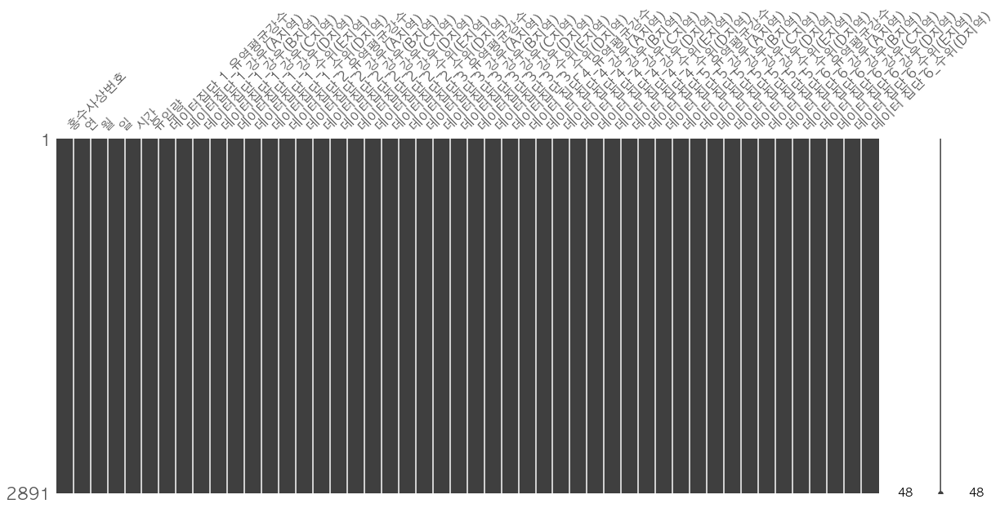

In [17]:
# 결측치 확인 그래프

import missingno as msno
msno.matrix(df, figsize=(20,8))

<br>
<br>

In [18]:
df['유입량'].describe()

# 평균이 약 1747인데 중앙값은 약 1066 정도
# 상위 75%까지의 강수량이 약 2213인데, max는 약 21504
# 어느 시점에 마구 쏟아지는 것 같은 분포(장마철)

count     2891.000000
mean      1746.902717
std       2181.790290
min          3.541153
25%        384.762514
50%       1065.549253
75%       2213.014288
max      21504.402260
Name: 유입량, dtype: float64

<br>

In [31]:
cnts = data['홍수사상번호'].value_counts()
tmp = pd.Series([0], index=[0])
cnts = cnts.append(tmp)
cnts = cnts.sort_index().cumsum()

In [7]:
cnts = df['홍수사상번호'].value_counts()
tmp = pd.Series([0], index=[0])
cnts = cnts.append(tmp)
cnts = cnts.sort_index().cumsum()


## 지난 번에 사용했던 이상치 탐색

In [406]:
# 홍수사상번호 별로 구간을 나누어 이상치 구하기

s = 0  # 이상치 총 개수

for i in range(1,26):
    IQR = df['유입량'][cnts[i-1]:cnts[i]].quantile(0.75) - df['유입량'][cnts[i-1]:cnts[i]].quantile(0.25)
    max_value = df['유입량'][cnts[i-1]:cnts[i]].quantile(0.75) + 1.5*IQR
    min_value = df['유입량'][cnts[i-1]:cnts[i]].quantile(0.25) - 1.5*IQR
    if min_value <= 0: min_value = 0
    
    isOutlier = df['유입량'][cnts[i-1]:cnts[i]] > max_value
    outliers = isOutlier.sum(axis=0)
    s += outliers
    
    # 이상치가 존재하면 출력
    if(outliers > 0):
        print("홍수사상번호 "+str(i)+"번의 이상치 개수:", outliers)

print("\n총 개수:",s)

홍수사상번호 1번의 이상치 개수: 21
홍수사상번호 12번의 이상치 개수: 10
홍수사상번호 15번의 이상치 개수: 16
홍수사상번호 16번의 이상치 개수: 32
홍수사상번호 20번의 이상치 개수: 23
홍수사상번호 22번의 이상치 개수: 37

총 개수: 139


이상치 처리를 어떻게 할지 고민?

<br>
<hr>
<br>

## 지수가중이동평균 이용하여 이상치 탐색

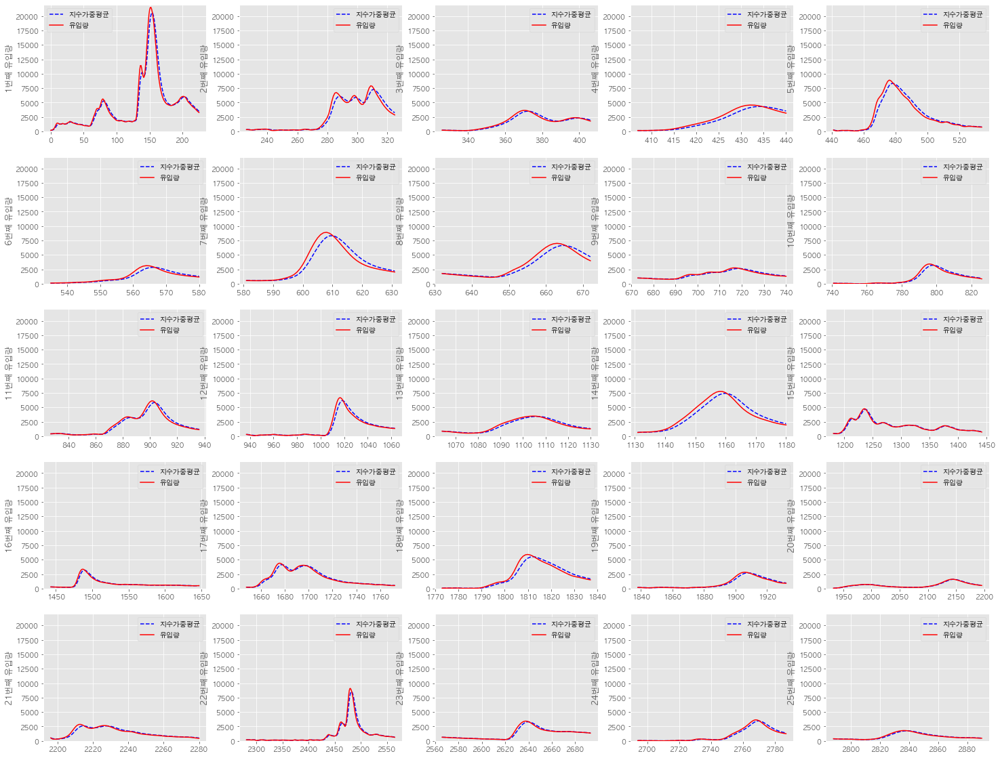

In [317]:
# 홍수사상번호마다 유입량 분포 및 지수가중이동평균을 이용항 가중치 탐색
fig, ax = plt.subplots(5,5,figsize=(25,20))

for i in range(1,26):
    plt.subplot(5,5,i)

    flood = df['유입량'][cnts[i-1]:cnts[i]]
    eMov = flood.ewm(span=5).mean()
    plt.plot(eMov, linestyle='--', color='b', label = "지수가중평균")
    plt.plot(df['유입량'][cnts[i-1]:cnts[i]], color='r', label = "유입량")
    
    plt.ylabel(str(i)+"번째 유입량")
    plt.ylim(0,22000)
    plt.legend()
plt.show()

https://repository.hira.or.kr/bitstream/2019.oak/1659/2/이상치%20탐색을%20위한%20통계적%20방법과%20활용%20방안.pdf

시계열 데이터의 이상치 탐색 방법 중 하나인 지수가중이동평균을 사용하여 이상치 탐색

이 결과를 보면 이상치 처리는 따로 없어도 될 듯?

<br>
<br>

In [43]:
# 데이터집단 별로 그룹을 나누어 줌
dataGroup = [df.iloc[:,i:i+7] for i in range(6,48,7)]

<Figure size 1800x1440 with 0 Axes>

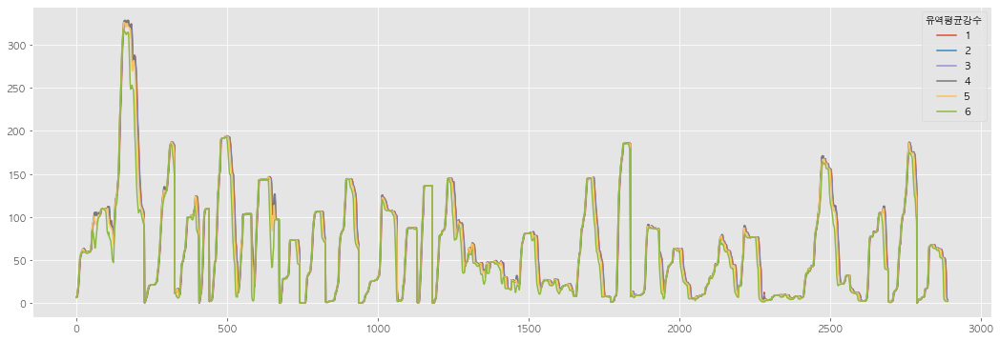

<Figure size 1800x1440 with 0 Axes>

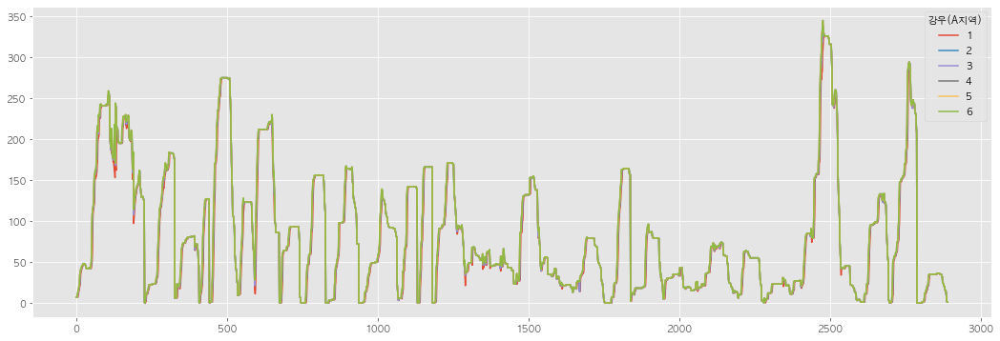

<Figure size 1800x1440 with 0 Axes>

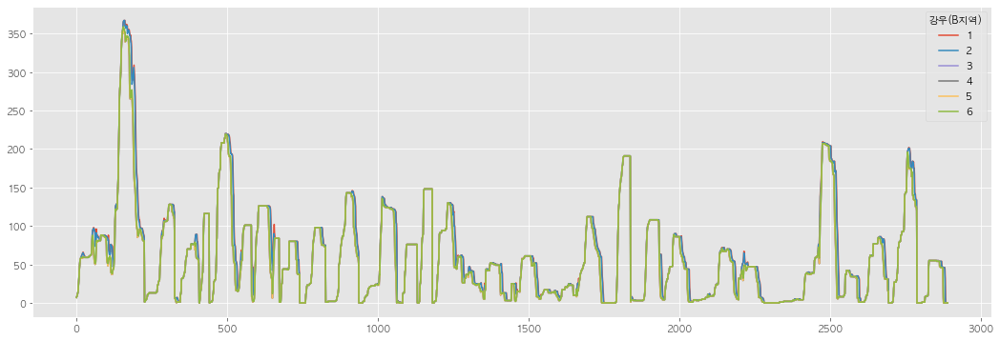

<Figure size 1800x1440 with 0 Axes>

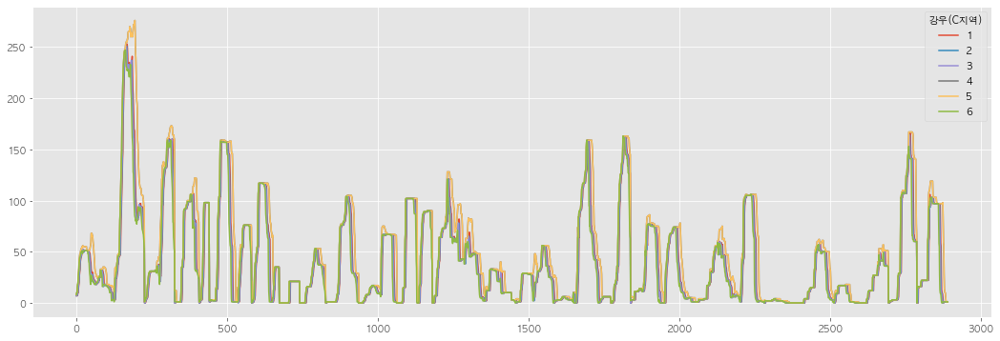

<Figure size 1800x1440 with 0 Axes>

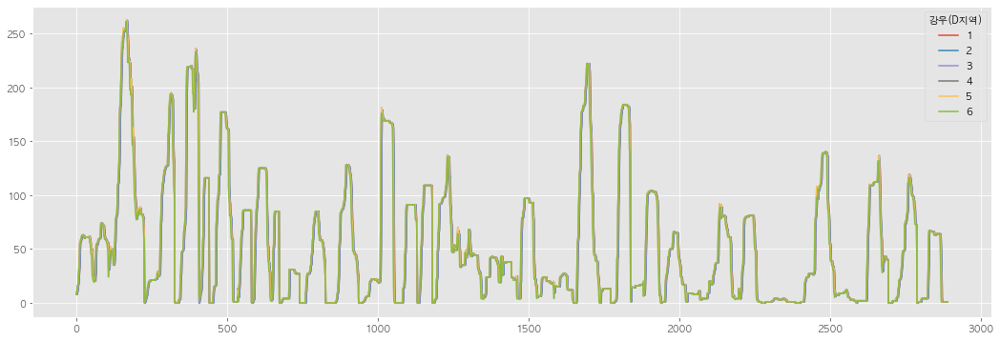

<Figure size 1800x1440 with 0 Axes>

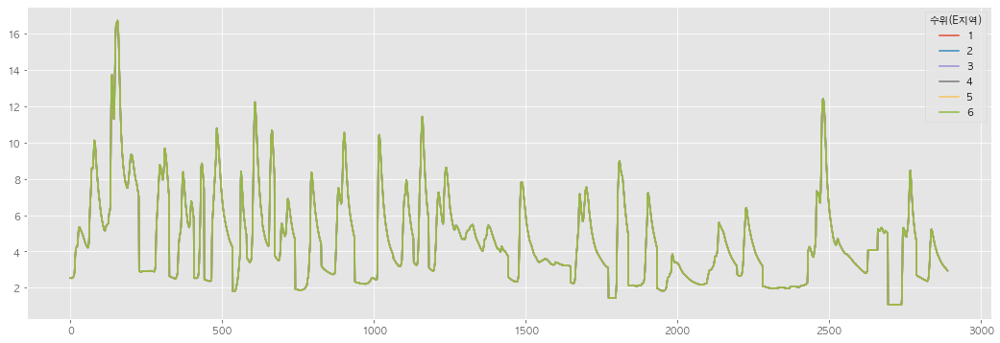

<Figure size 1800x1440 with 0 Axes>

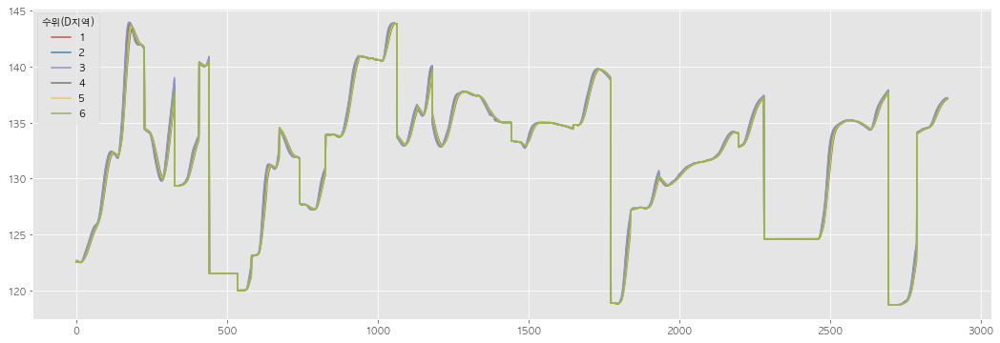

In [421]:
## 각 시간대마다 데이터 집단 간의 변수들의 값 중에 이상치를 가지는지 확인(x축은 시간 순으로 정렬된 인덱스)
variables = ['유역평균강수','강우(A지역)','강우(B지역)','강우(C지역)','강우(D지역)','수위(E지역)','수위(D지역)']

for i in range(7):
    plt.figure(figsize=(25, 20))
    data = df[variables[i]]
    data.columns = list(range(1,7))
    data.plot(figsize=(18,6))
    plt.legend(title=variables[i])
plt.show()

**7개의 변수 모두 6개의 데이터 집단 내에서 비슷한 값을 가짐.**

<br>
<br>

<br>
<br>

In [44]:
dataGroup = [df.iloc[:,i:i+7] for i in range(6,48,7)]

<ipython-input-418-e888d93ca0da>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure, axes = plt.subplots(1,7,figsize=(60,5))


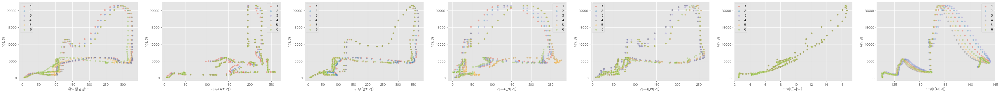

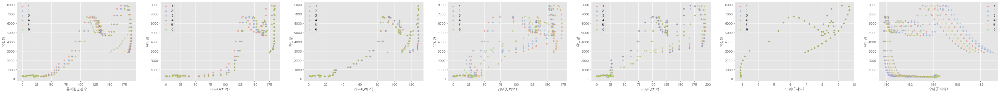

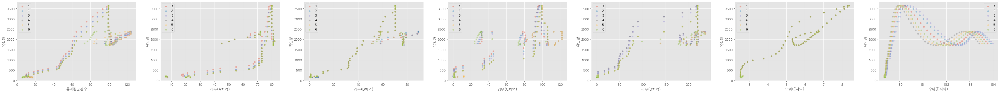

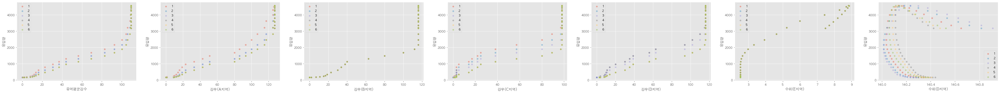

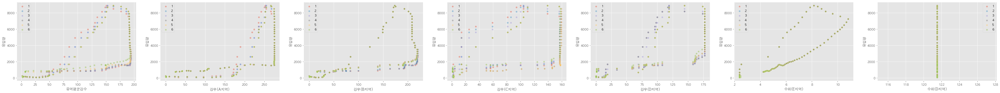

...

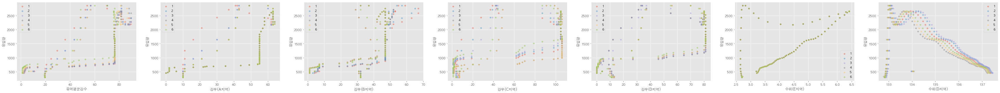

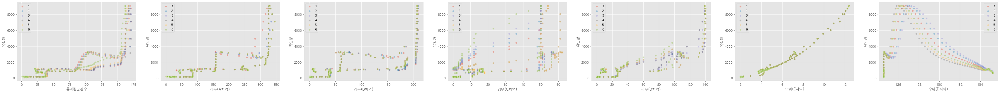

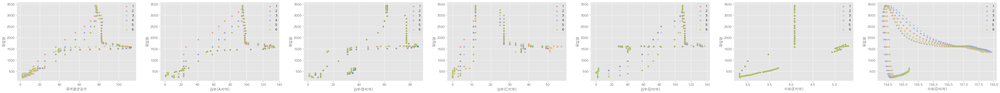

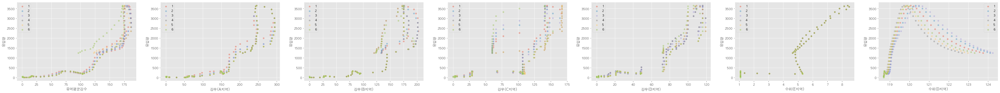

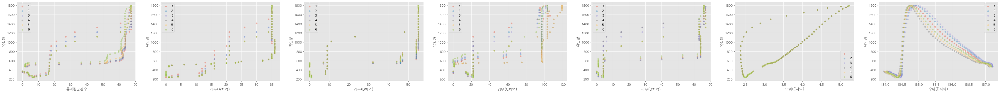

In [418]:
# 25 * 7
# 각 행이 홍수사상번호, 각 열이 데이터 집단의 7가지 변수

for k in range(1,26):
    figure, axes = plt.subplots(1,7,figsize=(60,5))
    for i in range(7):
        for j in range(6):
            temp = dataGroup[j][cnts[k-1]:cnts[k]]
            sns.scatterplot(x=temp.iloc[:,i], y=df['유입량'][cnts[k-1]:cnts[k]], alpha=0.4,
                            label=j+1, ax=axes[i])
        axes[i].set_xlabel(dataGroup[0].columns[i].split('_')[1])
        axes[i].legend()
        axes[i].set_ylabel("유입량")
plt.show()

In [45]:
res = []
for i in range(1,26):
    row = np.zeros(7)
    for k in range(6,13):
        tmp = np.zeros(6)
        for j in range(6):
            corrDf = pd.concat([df.iloc[cnts[i-1]:cnts[i],5],df.iloc[cnts[i-1]:cnts[i],k+7*j]], axis=1)
            tmp[j] = corrDf.corr().iloc[1,0]
        avg_corr = tmp.sum()/6
        row[k-6] = avg_corr
    res.append(row)

res = np.array(res)
corr_df = pd.DataFrame(res, index=list(range(1,26)), 
                       columns = ['유역평균강수', '강우(A지역)', '강우(B지역)', 
                                  '강우(C지역)', '강우(D지역)', '수위(E지역)', '수위(D지역)'])

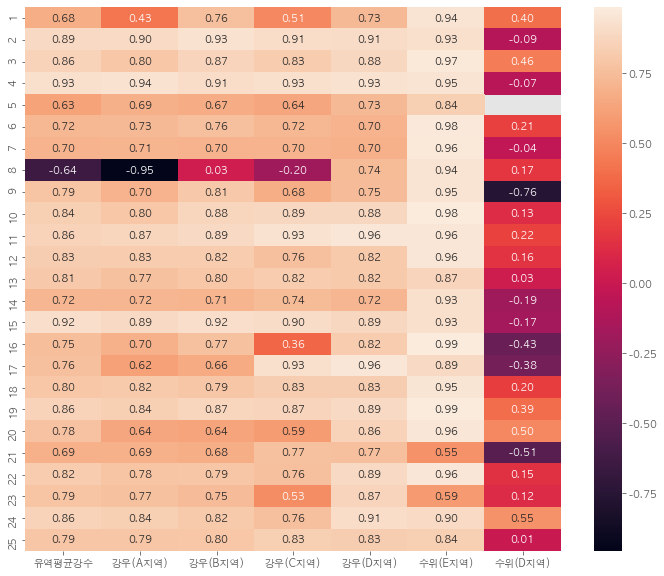

In [201]:
# (홍수사상번호별 유입량) * (변수) heatmap

fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(corr_df,annot=True, fmt='0.2f')
plt.show()

**수위(D지역)을 제외하고는 대부분 유입량과 양의 관계를 가진다.**

<br>
<br>
<br>
<br>


**lagging 적용하기**

In [144]:
# 홍수사상번호 별로 lagging 적용

floods={}
df2 = df.copy()
tmp = df2.iloc[:,6:]

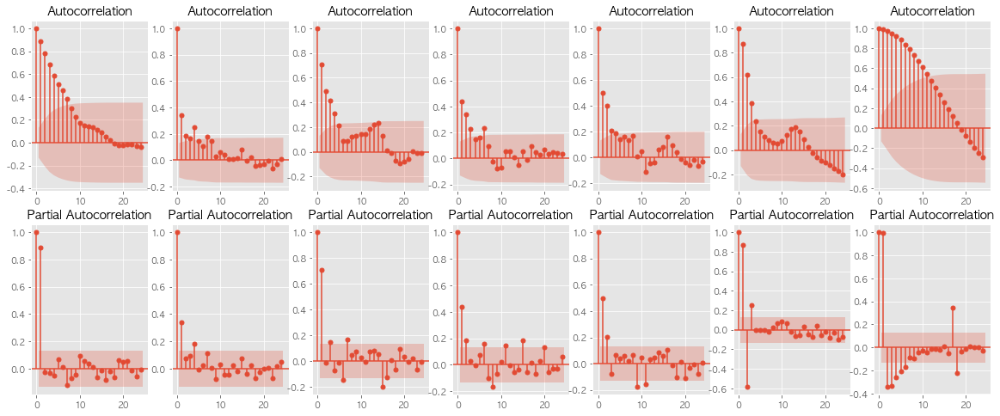

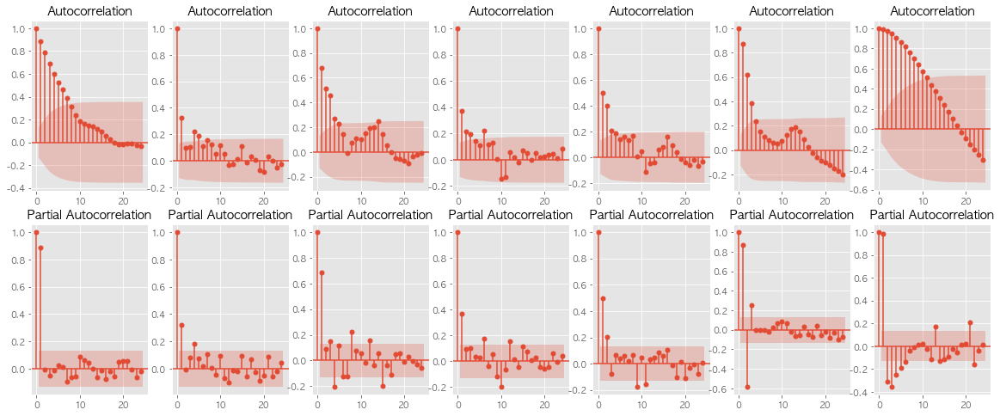

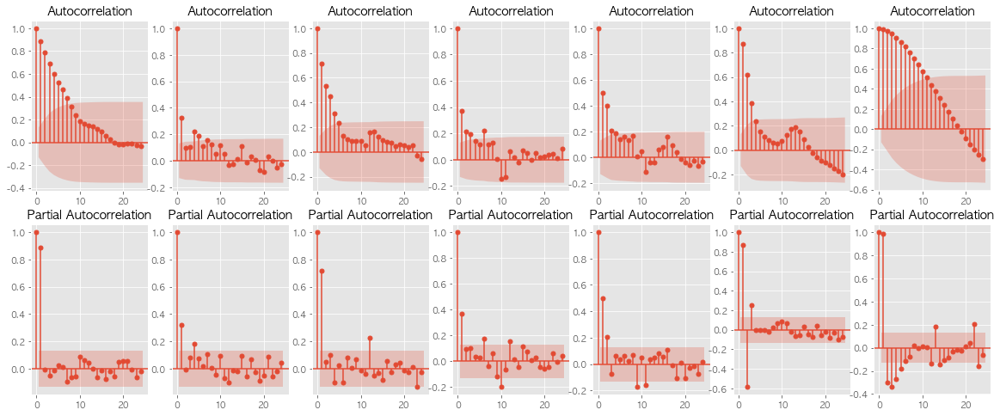

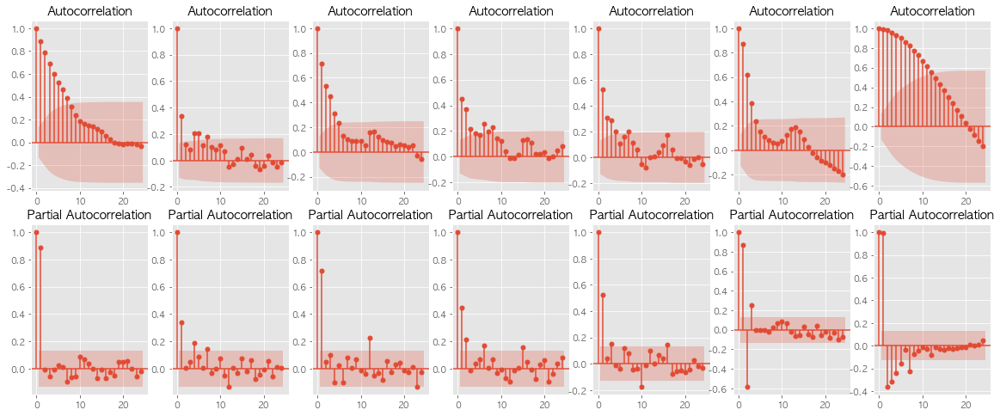

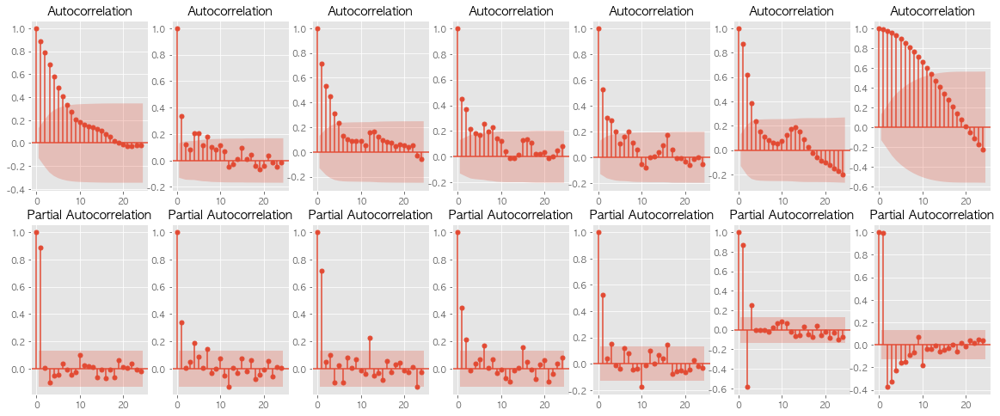

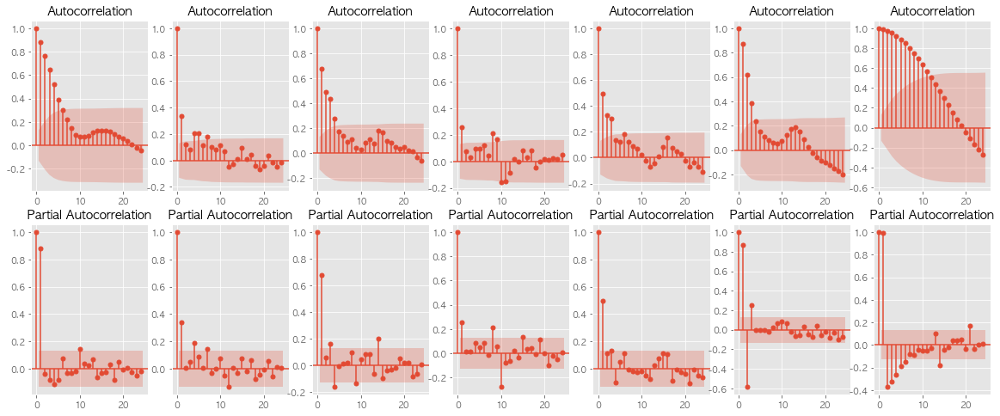

In [375]:
# ACF, PACF를 통하여 적절한 시점 알아보기

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


for j in range(6):
    fig, ax = plt.subplots(2,7,figsize=(20,8))
    for i in range(7): # 홍수사상번호 1, 변수 별 acf, pacf 적용
        group = dataGroup[j][cnts[0]:cnts[1]]
        data = group.iloc[:,i].astype(float)
        data += 0.00001*np.random.rand(data.shape[0])

        # log변환, 차분 적용
        data = np.log1p(data)
        data = data.diff(periods=1).iloc[1:]

        plot_acf(data, ax=ax[0,i])
        plot_pacf(data, method='ywmle', ax=ax[1,i])
plt.show()

In [145]:
display(tmp)

,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),데이터집단 1_강우(D지역),데이터집단 1_수위(E지역),데이터집단 1_수위(D지역),데이터집단 2_유역평균강수,데이터집단 2_강우(A지역),데이터집단 2_강우(B지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
0,6.4000,7,7,7,8,2.54,122.56875,6.3000,7,7,...,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610
1,6.3000,7,8,7,8,2.53,122.56250,6.4000,7,8,...,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600
2,6.4000,7,9,7,8,2.53,122.55625,7.3000,7,9,...,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590
3,7.3000,7,10,7,8,2.53,122.55625,8.2000,7,10,...,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585
4,8.2000,7,12,8,10,2.53,122.55625,11.3000,9,12,...,16,2.53,122.604,14.4000,12,12,18,16,2.53,122.575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,22.7836,6,0,1,1,3.03,137.16875,8.2586,6,0,...,1,3.03,137.088,1.7366,6,0,1,1,3.03,137.130
2887,8.2586,2,0,1,1,3.00,137.18125,4.1089,2,0,...,1,3.00,137.104,1.7366,2,0,1,1,3.00,137.145
2888,4.1089,1,0,1,1,2.98,137.18750,3.3854,1,0,...,1,2.98,137.120,1.7366,1,0,1,1,2.98,137.155
2889,3.3854,1,0,1,1,2.96,137.19375,3.2841,1,0,...,1,2.96,137.136,1.7366,1,0,1,1,2.96,137.165


In [145]:
'''홍수사상번호 별로 lagging 적용하기'''
for i in range(1,26):
    floods[i] = tmp[cnts[i-1]:cnts[i]]

In [249]:
for i in range(1,26):
    floods[i] = floods[i].shift(2)

In [146]:
for i in range(1,26):
    floods[i] = floods[i].shift(-1)

In [86]:
for i in range(1,26):
    floods[i] = floods[i].shift(-2)

In [147]:
shifted = pd.concat([floods[1],floods[2]])

In [148]:
for i in range(3,26):
    shifted = pd.concat([shifted,floods[i]])

In [150]:
'''lagging 적용 Dataframe'''
display(shifted)

,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),데이터집단 1_강우(D지역),데이터집단 1_수위(E지역),데이터집단 1_수위(D지역),데이터집단 2_유역평균강수,데이터집단 2_강우(A지역),데이터집단 2_강우(B지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6.4000,7.0,7.0,7.0,8.0,2.54,122.56875,6.3000,7.0,7.0,...,8.0,2.54,122.660,6.4000,7.0,7.0,8.0,8.0,2.54,122.610
3,6.3000,7.0,8.0,7.0,8.0,2.53,122.56250,6.4000,7.0,8.0,...,10.0,2.53,122.648,7.3000,7.0,8.0,10.0,10.0,2.53,122.600
4,6.4000,7.0,9.0,7.0,8.0,2.53,122.55625,7.3000,7.0,9.0,...,11.0,2.53,122.636,8.2000,7.0,9.0,10.0,11.0,2.53,122.590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,42.1892,15.0,0.0,1.0,1.0,3.07,137.14375,36.5129,15.0,0.0,...,1.0,3.07,137.052,1.7908,15.0,0.0,1.0,1.0,3.07,137.100
2887,36.5129,10.0,0.0,1.0,1.0,3.05,137.15625,22.7836,10.0,0.0,...,1.0,3.05,137.072,1.7908,10.0,0.0,1.0,1.0,3.05,137.115
2888,22.7836,6.0,0.0,1.0,1.0,3.03,137.16875,8.2586,6.0,0.0,...,1.0,3.03,137.088,1.7366,6.0,0.0,1.0,1.0,3.03,137.130
2889,8.2586,2.0,0.0,1.0,1.0,3.00,137.18125,4.1089,2.0,0.0,...,1.0,3.00,137.104,1.7366,2.0,0.0,1.0,1.0,3.00,137.145


In [149]:
shifted = pd.concat([df2.iloc[:,:6], shifted], axis=1)

In [150]:
shifted.head()  # lagging 적용 완료

,홍수사상번호,연,월,일,시간,유입량,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
0,1,2006,7,10,8,189.100000,6.3,7.0,8.0,7.0,...,10.0,2.53,122.648,7.3,7.0,8.0,10.0,10.0,2.53,122.600
1,1,2006,7,10,9,216.951962,6.4,7.0,9.0,7.0,...,11.0,2.53,122.636,8.2,7.0,9.0,10.0,11.0,2.53,122.590
2,1,2006,7,10,10,251.424419,7.3,7.0,10.0,7.0,...,14.0,2.53,122.620,11.3,9.0,10.0,15.0,14.0,2.53,122.585
3,1,2006,7,10,11,302.812199,8.2,7.0,12.0,8.0,...,16.0,2.53,122.604,14.4,12.0,12.0,18.0,16.0,2.53,122.575
4,1,2006,7,10,12,384.783406,11.3,7.0,14.0,10.0,...,17.0,2.53,122.592,16.9,14.0,14.0,19.0,17.0,2.53,122.565


In [152]:
shifted.iloc[[225,226,227]]

,홍수사상번호,연,월,일,시간,유입량,데이터집단 1_유역평균강수,데이터집단 1_강우(A지역),데이터집단 1_강우(B지역),데이터집단 1_강우(C지역),...,데이터 집단 5_강우(D지역),데이터 집단 5_수위(E지역),데이터 집단 5_수위(D지역),데이터 집단 6_유역평균강수,데이터 집단 6_강우(A지역),데이터 집단 6_강우(B지역),데이터 집단 6_강우(C지역),데이터 집단 6_강우(D지역),데이터 집단 6_수위(E지역),데이터 집단 6_수위(D지역)
225,1,2006,7,19,17,3285.961383,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
226,2,2006,7,25,24,323.993267,0.0,0.0,2.0,0.0,...,1.0,2.91,134.48,1.5,1.0,2.0,2.0,1.0,2.91,134.46
227,2,2006,7,26,1,323.154138,0.5,0.0,2.0,0.0,...,2.0,2.90,134.46,2.6,2.0,2.0,3.0,2.0,2.90,134.44


In [98]:
# 데이터집단 별로 그룹 나누기

dataGroup2 = [shifted.iloc[:,i:i+7] for i in range(6,48,7)]

<ipython-input-32-23bc96bdb75d>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure, axes = plt.subplots(1,7,figsize=(60,5))


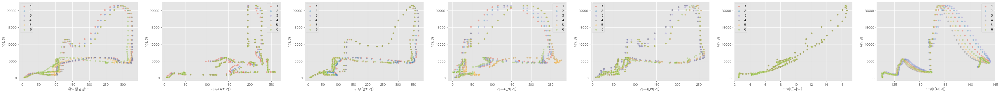

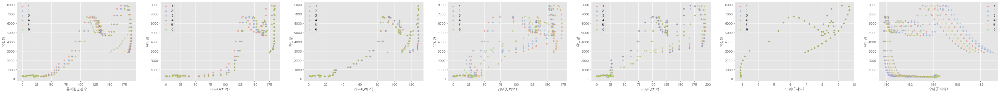

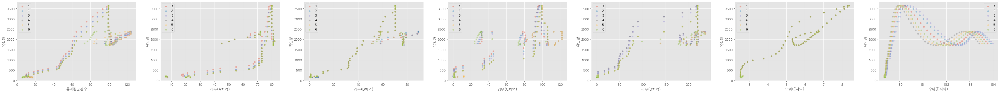

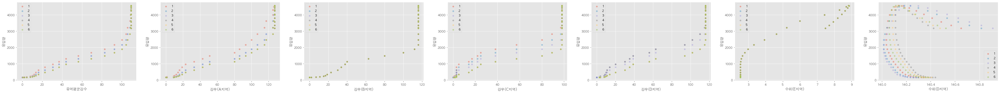

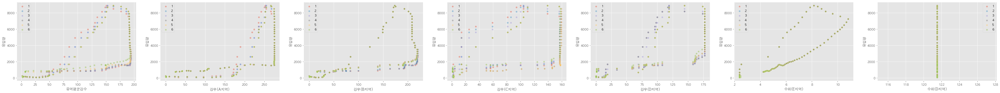

...

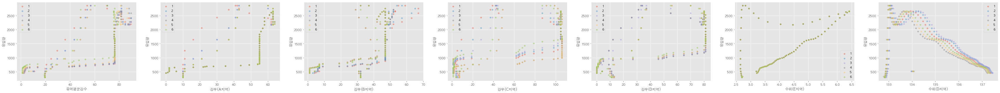

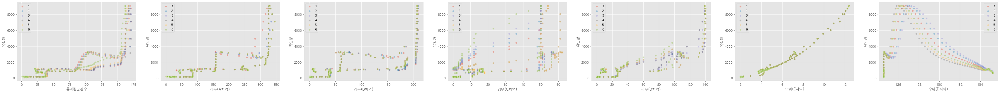

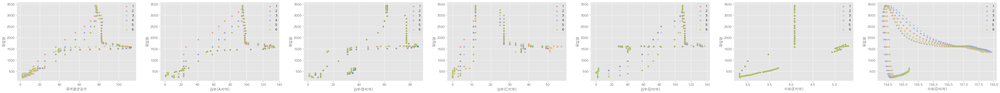

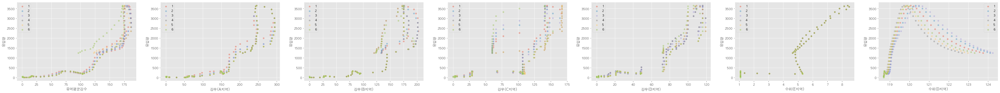

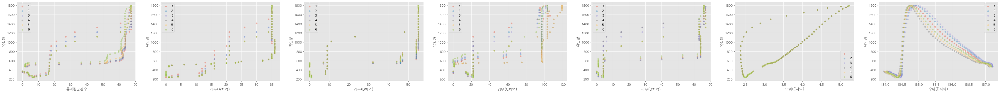

In [32]:
# 각 행이 홍수사상번호 순, 각 열이 변수 순, lagging 적용

for k in range(1,26):
    figure, axes = plt.subplots(1,7,figsize=(60,5))
    for i in range(7):
        for j in range(6):
            temp = dataGroup[j][cnts[k-1]:cnts[k]]
            sns.scatterplot(x=temp.iloc[:,i], y=df['유입량'][cnts[k-1]:cnts[k]], alpha=0.4,
                            label=j+1, ax=axes[i])
        axes[i].set_xlabel(dataGroup2[0].columns[i].split('_')[1])
        axes[i].legend()
        axes[i].set_ylabel("유입량")
plt.show()

In [73]:
res = []
for i in range(1,26):
    row = np.zeros(7)
    for k in range(6,13):
        tmp = np.zeros(6)
        for j in range(6):
            corrDf = pd.concat([shifted.iloc[cnts[i-1]:cnts[i],5],shifted.iloc[cnts[i-1]:cnts[i],k+7*j]], axis=1)
            tmp[j] = corrDf.corr().iloc[1,0]
        avg_corr = tmp.sum()/6
        row[k-6] = avg_corr
    res.append(row)

res = np.array(res)
corr_df_lag = pd.DataFrame(res, index=list(range(1,26)), 
                       columns = ['유역평균강수', '강우(A지역)', '강우(B지역)', 
                                  '강우(C지역)', '강우(D지역)', '수위(E지역)', '수위(D지역)'])

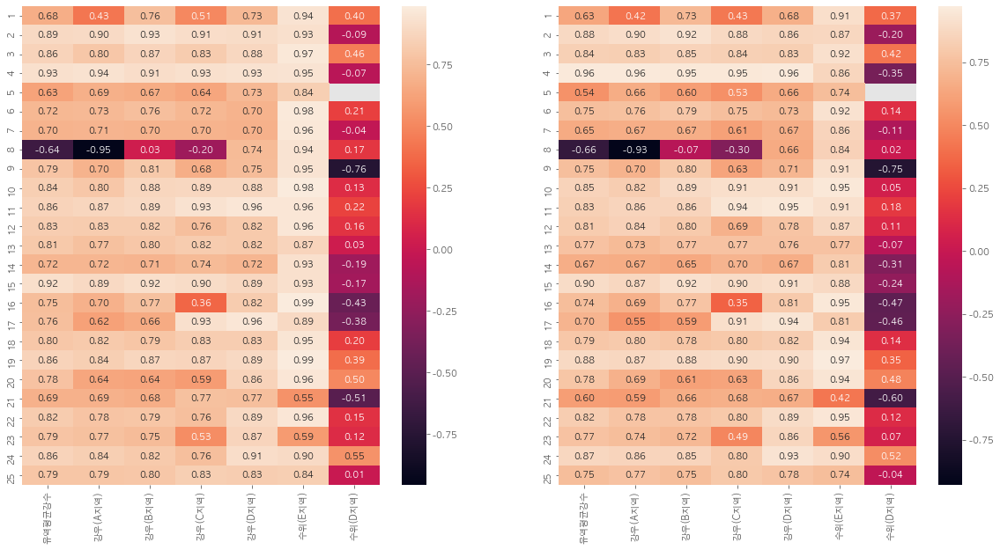

In [254]:
# 왼쪽 lagging X, 오른쪽 lagging
fig, ax = plt.subplots(1,2,figsize=(20,10))
sns.heatmap(corr_df,annot=True, fmt='0.2f', ax=ax[0])
sns.heatmap(corr_df_lag,annot=True, fmt='0.2f', ax=ax[1])
plt.show()

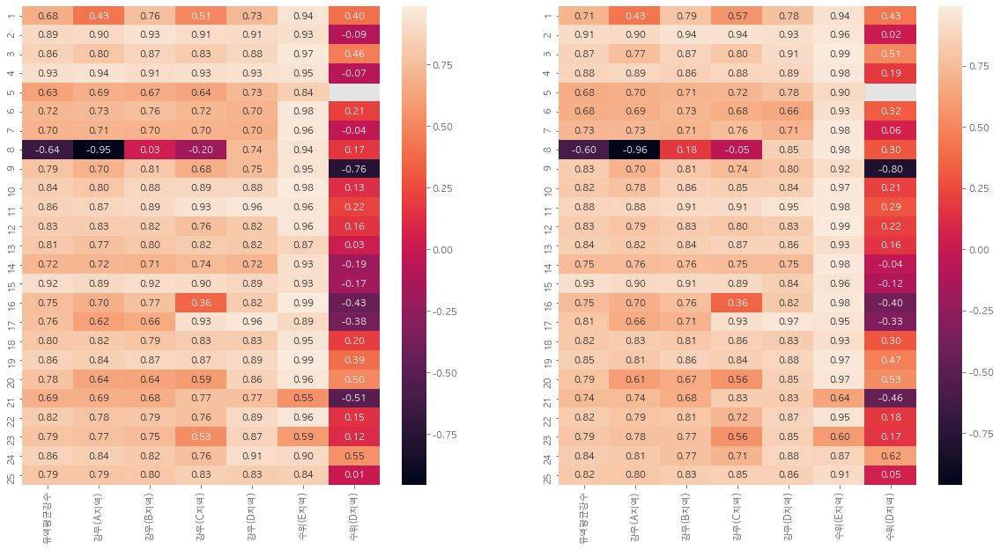

In [99]:
# lagging (-1)
fig, ax = plt.subplots(1,2,figsize=(20,10))
sns.heatmap(corr_df,annot=True, fmt='0.2f', ax=ax[0])
sns.heatmap(corr_df_lag,annot=True, fmt='0.2f', ax=ax[1])
plt.show()

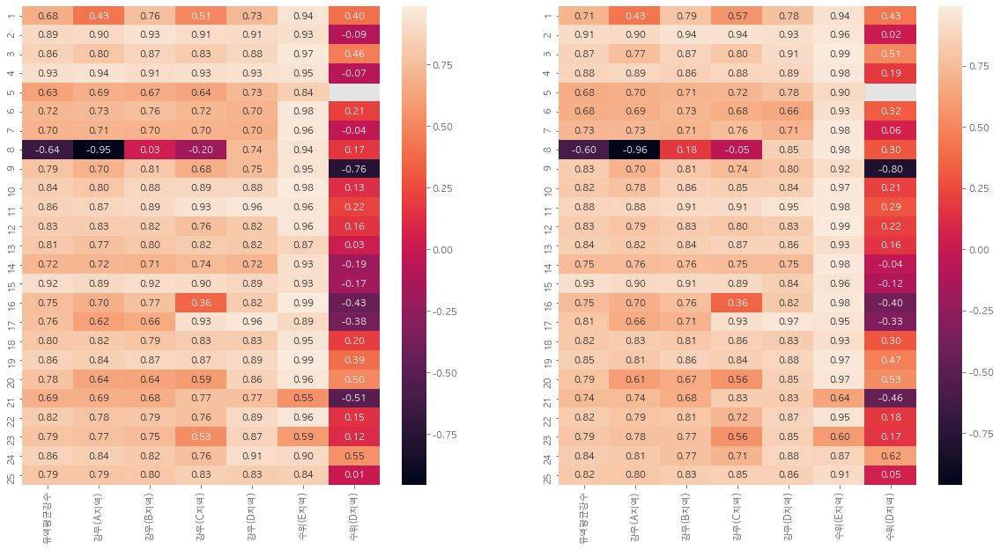

In [91]:
# 왼쪽 lagging X, 오른쪽 lagging(-2)
fig, ax = plt.subplots(1,2,figsize=(20,10))
sns.heatmap(corr_df,annot=True, fmt='0.2f', ax=ax[0])
sns.heatmap(corr_df_lag,annot=True, fmt='0.2f', ax=ax[1])
plt.show()

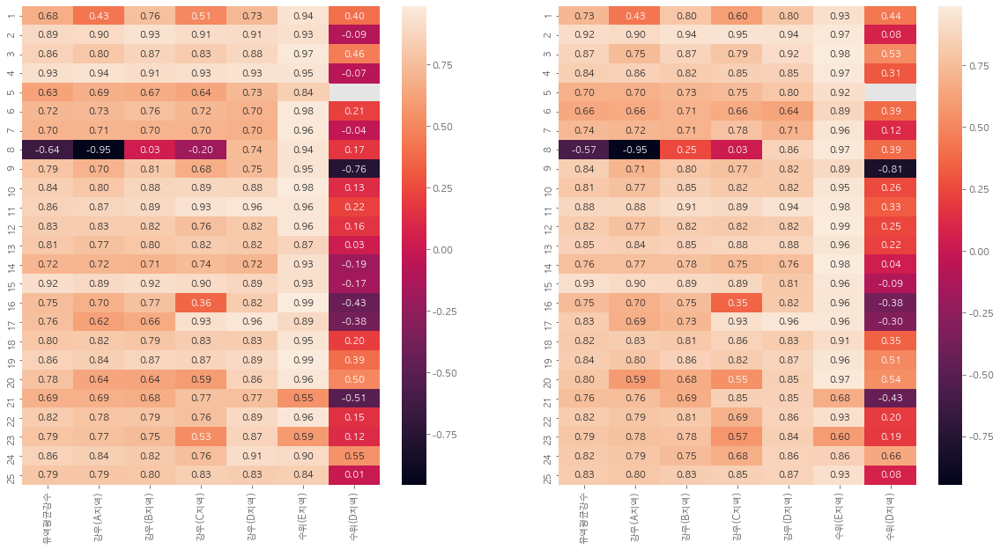

In [62]:
# 왼쪽 lagging X, 오른쪽 lagging(-3)
fig, ax = plt.subplots(1,2,figsize=(20,10))
sns.heatmap(corr_df,annot=True, fmt='0.2f', ax=ax[0])
sns.heatmap(corr_df_lag,annot=True, fmt='0.2f', ax=ax[1])
plt.show()

<hr>

In [6]:
## 제공 데이터 불러오기
data = pd.read_excel('/Users/andrew/hongsu/data/01_제공데이터/2021 빅콘테스트_데이터분석분야_퓨처스리그_홍수ZERO_댐유입량,강우,수위데이터_210803.xlsx', header=[0,1])
data.columns = ['_'.join(col).strip() if "Unnamed" not in col[1] else col[0] for col in data.columns.values]

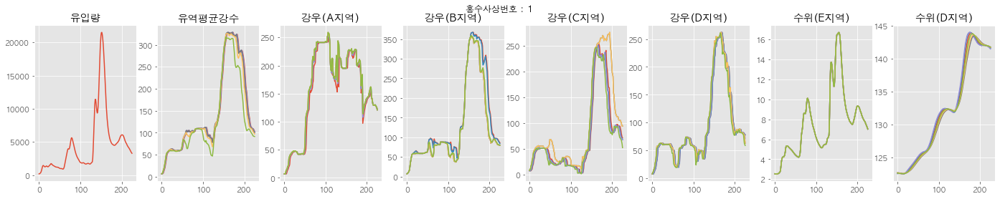

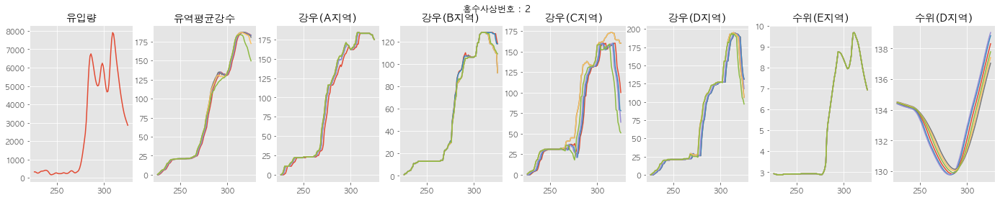

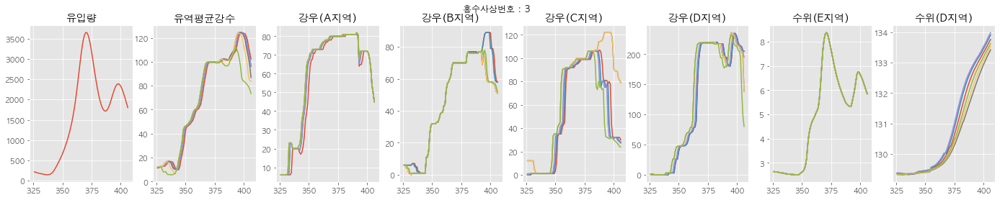

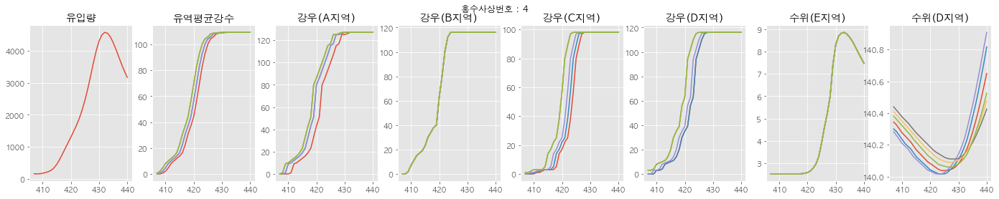

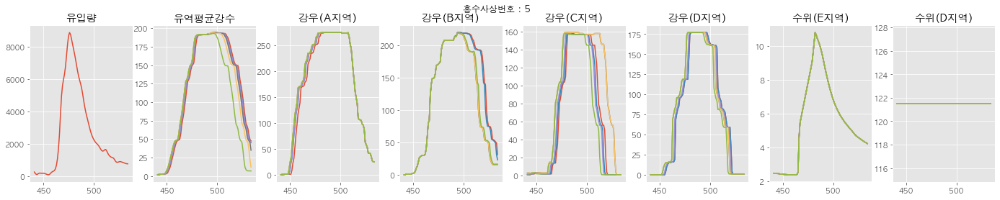

...

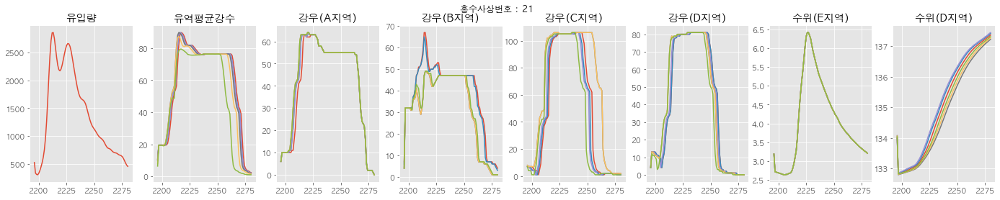

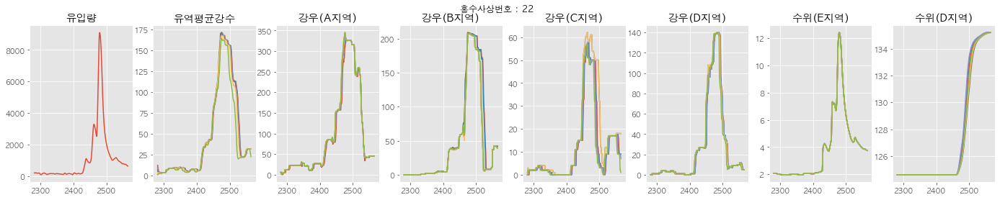

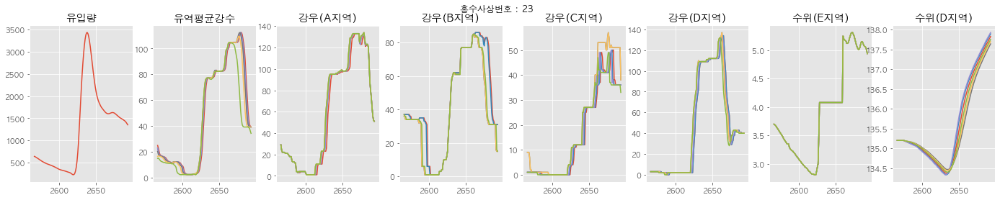

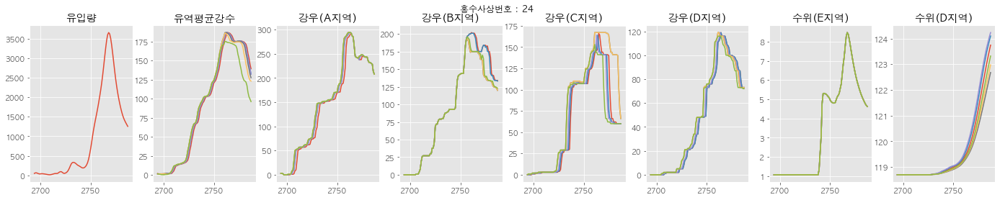

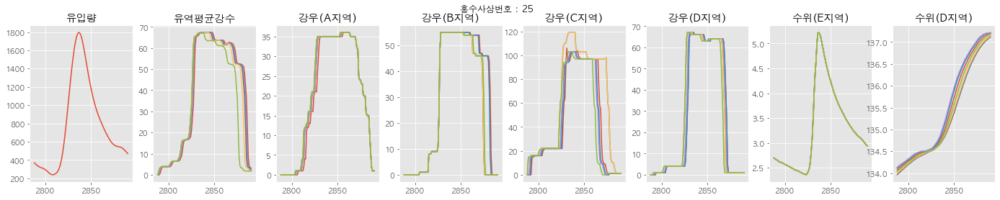

In [3]:
col_list = ['유입량','유역평균강수', '강우\(A지역\)', '강우\(B지역\)', 
            '강우\(C지역\)', '강우\(D지역\)', '수위\(E지역\)', '수위\(D지역\)']

n = 8
for num in data.홍수사상번호.unique():
    axe_list = []
    data_num = data[data.홍수사상번호 == num].copy()
    fig = plt.figure(figsize=(24,4))
    for i in range(n):
        axe_list.append(fig.add_subplot(1, n, i+1))
        data_num.filter(regex=col_list[i]).plot(ax=axe_list[i])
        axe_list[i].legend().set_visible(False)
        axe_list[i].set_title(col_list[i].replace("\\", ''))
    plt.suptitle(f'홍수사상번호 : {num}')
    plt.show()

In [33]:
cnts = data['홍수사상번호'].value_counts()
tmp = pd.Series([0], index=[0])
cnts = cnts.append(tmp)
cnts = cnts.sort_index().cumsum()

### Data

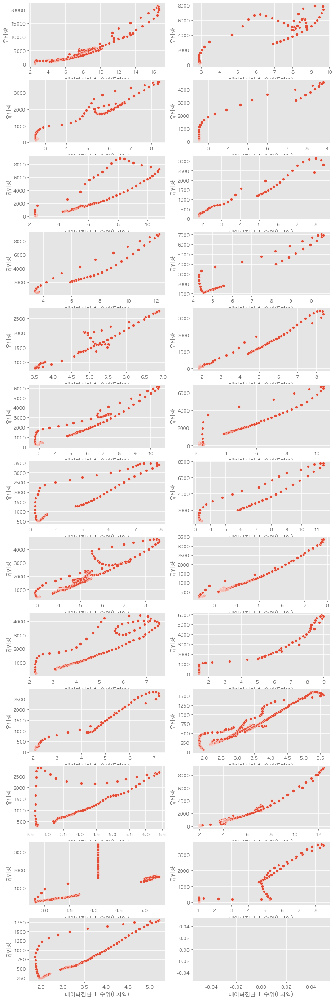

In [131]:
fig,ax = plt.subplots(13,2,figsize=(12,40))
for i in data.홍수사상번호.unique():
    plt.subplot(13,2,i)
    sns.scatterplot("데이터집단 1_수위(E지역)", "유입량", data=data[cnts[i-1]:cnts[i]])

### Transformation for Nonlinearity only

### X' = X^2 (shifted(-1))
#### 제일 선형 관계를 가지나, y값이 좀 넓게 퍼지는 경향

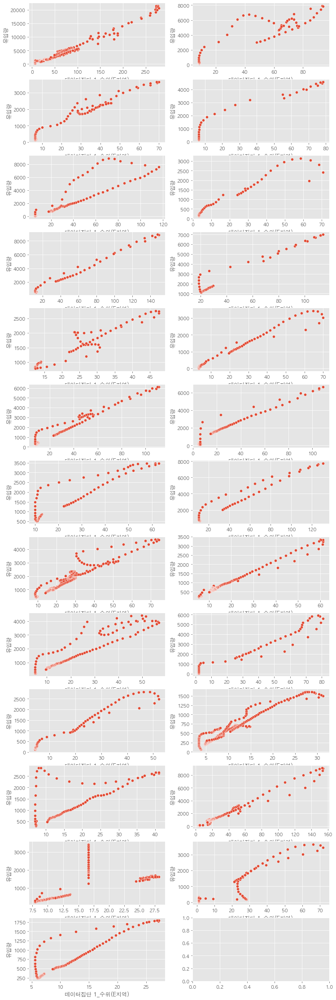

In [155]:
sq_x = shifted["데이터집단 1_수위(E지역)"] ** 2
fig,ax = plt.subplots(13,2,figsize=(12,40))
for i in data.홍수사상번호.unique():
    plt.subplot(13,2,i)
    sns.scatterplot(sq_x[cnts[i-1]:cnts[i]], shifted['유입량'][cnts[i-1]:cnts[i]])

### X' = X^2

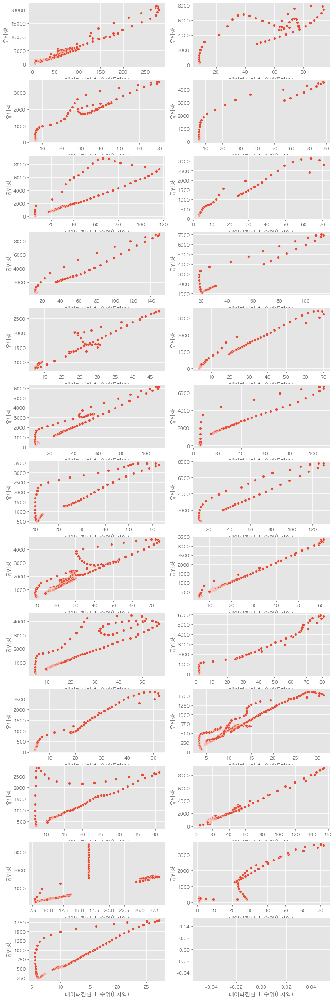

In [136]:
sq_x = data["데이터집단 1_수위(E지역)"] ** 2
fig,ax = plt.subplots(13,2,figsize=(12,40))
for i in data.홍수사상번호.unique():
    plt.subplot(13,2,i)
    sns.scatterplot(sq_x[cnts[i-1]:cnts[i]], data['유입량'][cnts[i-1]:cnts[i]])

### Y' = log(Y) && X' = X^2 && X'' = log(X') (shifted(-1))
#### 제일 고르게 퍼지고 선형을 가지나, 초반에 급상승하는 부분에 주의가 필요

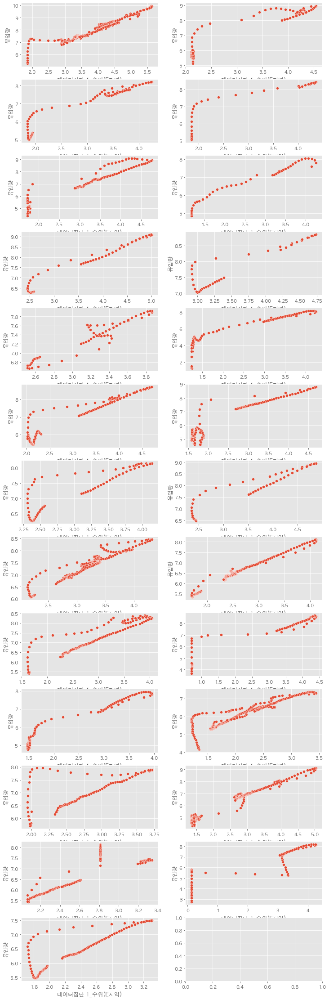

In [153]:
sq_x = shifted["데이터집단 1_수위(E지역)"] ** 2
log_y = np.log(shifted['유입량'])
log_sq_x = np.log(sq_x)
fig,ax = plt.subplots(13,2,figsize=(12,40))
for i in data.홍수사상번호.unique():
    plt.subplot(13,2,i)
    sns.scatterplot(log_sq_x[cnts[i-1]:cnts[i]], log_y[cnts[i-1]:cnts[i]])

### Y' = log(Y) && X' = X^2 && X'' = log(X')

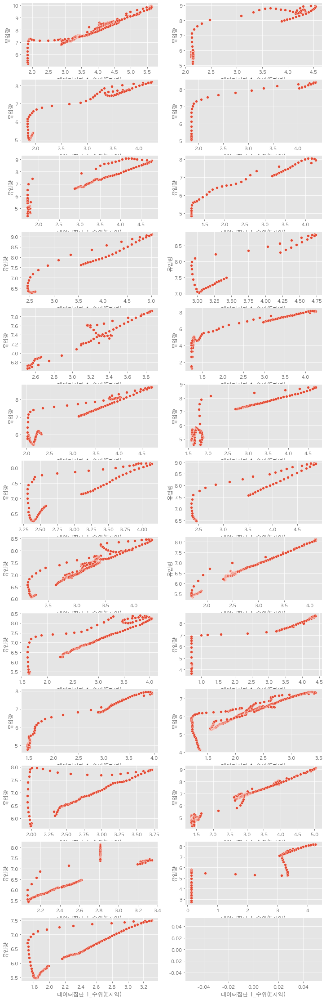

In [141]:
sq_x = data["데이터집단 1_수위(E지역)"] ** 2
log_y = np.log(data['유입량'])
log_sq_x = np.log(sq_x)
fig,ax = plt.subplots(13,2,figsize=(12,40))
for i in data.홍수사상번호.unique():
    plt.subplot(13,2,i)
    sns.scatterplot(log_sq_x[cnts[i-1]:cnts[i]], log_y[cnts[i-1]:cnts[i]])

### Y' = sqrt(Y) && X' = X^2
#### 이 변환도 선형을 많이 띄고 많이 퍼지지 않음

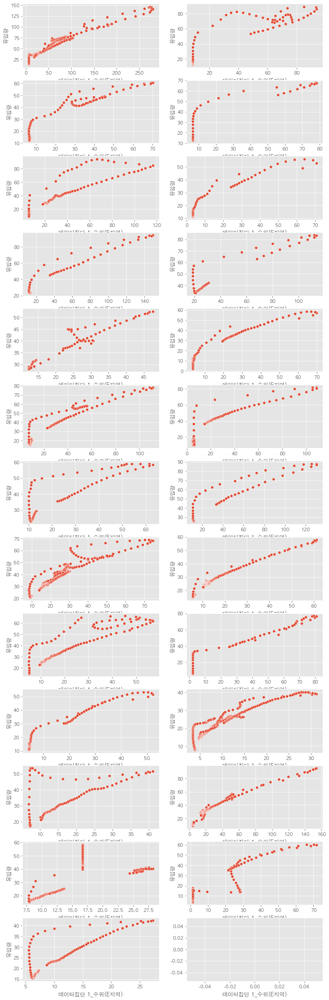

In [138]:
sq_x = data["데이터집단 1_수위(E지역)"] ** 2
sqrt_y = np.sqrt(data['유입량'])
fig,ax = plt.subplots(13,2,figsize=(12,40))
for i in data.홍수사상번호.unique():
    plt.subplot(13,2,i)
    sns.scatterplot(sq_x[cnts[i-1]:cnts[i]], sqrt_y[cnts[i-1]:cnts[i]])

<hr>